In [5]:
import numpy as np
import ellc
import matplotlib.pyplot as plt

In [6]:
plt.rcParams['figure.dpi'] = 200

In [7]:
t, y, yerr = np.loadtxt('../data/lc.kepler.data.txt', usecols=(0,1,2)).T

Text(0, 0.5, 'Flux')

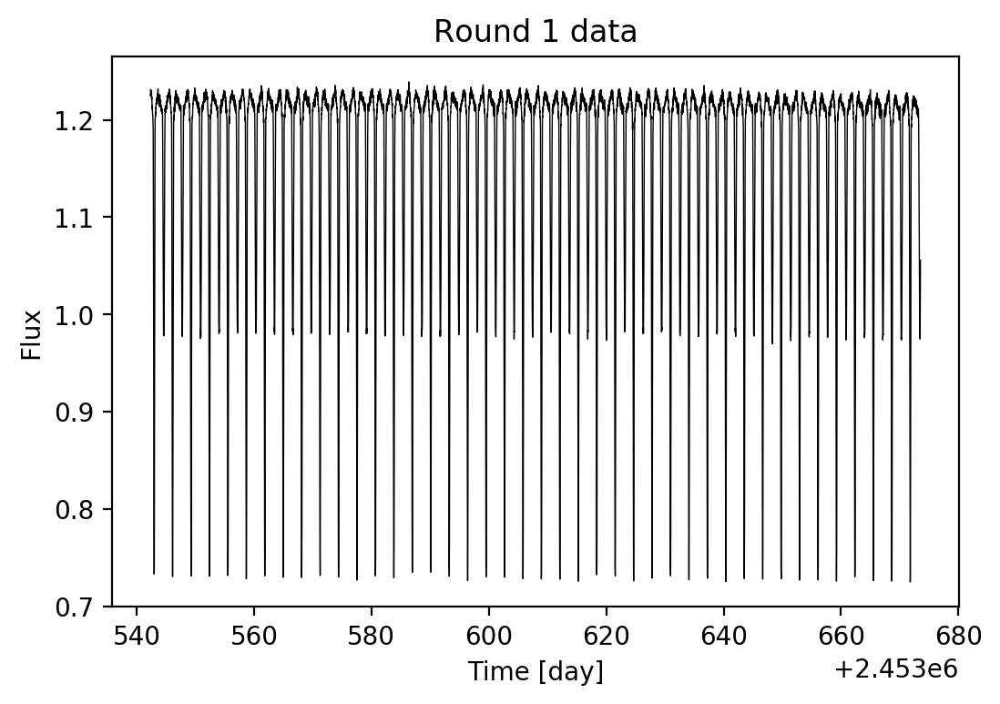

In [8]:
plt.plot(t, y, linewidth=0.5, c='black')
plt.title('Round 1 data')
plt.xlabel('Time [day]')
plt.ylabel('Flux')

In [9]:
from astropy.stats import BoxLeastSquares

m = np.zeros(len(t), dtype=bool)
period_grid = np.exp(np.linspace(np.log(2), np.log(50), 50000))
bls_results = []
periods = []
t0s = []
depths = []
durations = []
stats = []
# Compute the periodogram for each star by iteratively masking out
# eclipses from the higher signal to noise star.
for i in range(2):
    bls = BoxLeastSquares(t[~m], y[~m])
    bls_power = bls.power(period_grid, 0.1, oversample=20)
    bls_results.append(bls_power)

    # Save the highest peak as the planet candidate
    index = np.argmax(bls_power.power)
    periods.append(bls_power.period[index])
    t0s.append(bls_power.transit_time[index])
    depths.append(bls_power.depth[index])
    durations.append(bls_power.duration[index])
    
    stats.append(bls.compute_stats(periods[i], durations[i], t0s[i]))

    # Mask the data points that are in transit for this candidate
    m |= bls.transit_mask(t, periods[-1], 0.5, t0s[-1])

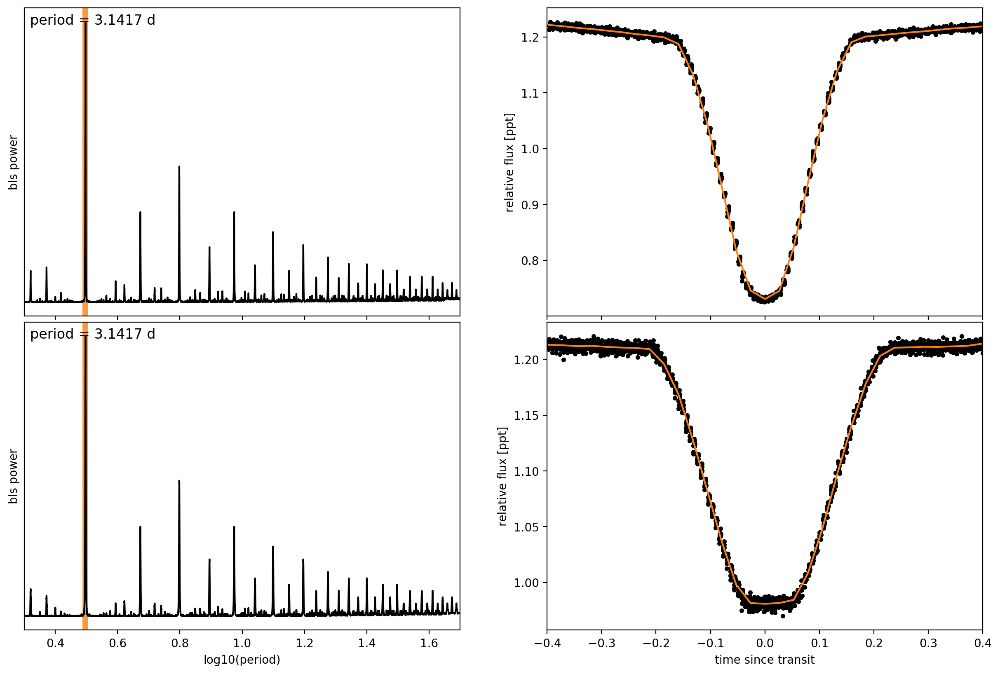

In [10]:

fig, axes = plt.subplots(len(bls_results), 2, figsize=(15, 10))

for i in range(len(bls_results)):
    # Plot the periodogram
    ax = axes[i, 0]
    ax.axvline(np.log10(periods[i]), color="C1", lw=5, alpha=0.8)
    ax.plot(np.log10(bls_results[i].period), bls_results[i].power, "k")
    ax.annotate("period = {0:.4f} d".format(periods[i]),
                (0, 1), xycoords="axes fraction",
                xytext=(5, -5), textcoords="offset points",
                va="top", ha="left", fontsize=12)
    ax.set_ylabel("bls power")
    ax.set_yticks([])
    ax.set_xlim(np.log10(period_grid.min()), np.log10(period_grid.max()))
    if i < len(bls_results) - 1:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel("log10(period)")

    # Plot the folded transit
    ax = axes[i, 1]
    p = periods[i]
    x_fold = (t - t0s[i] + 0.5*p) % p - 0.5*p
    m = np.abs(x_fold) < 0.4
    ax.plot(x_fold[m], y[m], ".k")

    # Overplot the phase binned light curve
    bins = np.linspace(-0.41, 0.41, 32)
    denom, _ = np.histogram(x_fold, bins)
    num, _ = np.histogram(x_fold, bins, weights=y)
    denom[num == 0] = 1.0
    ax.plot(0.5*(bins[1:] + bins[:-1]), num / denom, color="C1")

    ax.set_xlim(-0.4, 0.4)
    ax.set_ylabel("relative flux [ppt]")
    if i < len(bls_results) - 1:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel("time since transit")

fig.subplots_adjust(hspace=0.02)

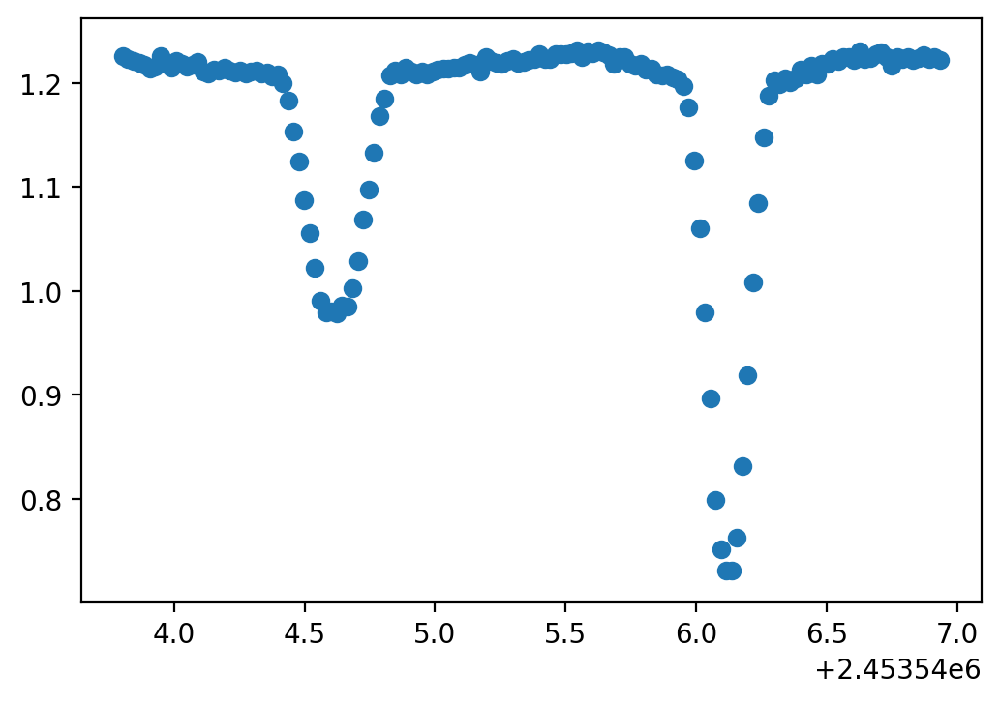

In [11]:
mask = (t > (t[0] + t0s[0]-0.5*periods[0])) & (t < (t[0] + t0s[0]+0.5*periods[0]))
t_transit = t[mask][::1]
y_transit = y[mask][::1]
yerr_transit = yerr[mask][::1]

y_transit# /= np.median(y_transit)
plt.scatter(t_transit, y_transit)

In [12]:
t0_guess = t[np.argmin(y)]

In [13]:
def q_to_u(q1, q2):
    return 2*np.sqrt(q1)*q2, np.sqrt(q1)*(1 - 2*q2)

def model(params, x):
#     period, rsum, rratio, incl, sbratio, t0, f_c, f_s, q11, q12, q21, q22 = params
    period, rsum, rratio, incl, sbratio, t0, f_c, f_s, mean = params
    r1, r2 = rsum/(1.+rratio), rsum*rratio/(1.+rratio)
    # Convert to LD
#     u11, u12 = q_to_u(q11,q12)
#     u21, u22 = q_to_u(q21,q22)
    lc = ellc.lc(x,t_zero=t0, #q=q,
            radius_1=r1, radius_2=r2,
             incl=incl, #hf_1=h1, hf_2=h2,
             sbratio=sbratio, shape_1='roche', shape_2='roche',# ld_1='quad', ld_2='quad', ldc_1=[u11, u12], ldc_2=[u21, u22],
             period=period, f_c=f_c, f_s=f_s)
    return lc + mean# / np.max(lc)

# def lnprior(params):
#     period, rsum, rratio, incl, sbratio, t0, f_c, f_s, q11, q12, q21, q22 = params
#     r1, r2 = rsum/(1.+rratio), rsum*rratio/(1.+rratio)
#     # Check LD1:
#     if (0 < q11 < 1) & (0 < q12 < 1) & (0 < q21 < 1) & (0 < q22 < 1) & (70 < incl < 90) & (sbratio < 1.5) & ((t0_guess-1) < t0 < (t0_guess+1)):
#         return 0.
#     else:
#         return -np.inf

def lnprior(params):
    period, rsum, rratio, incl, sbratio, t0, f_c, f_s, _ = params
    r1, r2 = rsum/(1.+rratio), rsum*rratio/(1.+rratio)
    # Check LD1:
    if (70 < incl < 90) & (sbratio < 1.5) & ((t0_guess-1) < t0 < (t0_guess+1)):
        return 0.
    else:
        return -np.inf
    
def lnlike(params, x, y, yerr):
    lp = lnprior(params)
    if not np.isfinite(lp):
        return -np.inf
    try:
        model_flux = model(params, x)
        return -0.5*np.sum((y-model_flux)**2/yerr**2)
    except:
        return -np.inf
    
from scipy.optimize import minimize
nll = lambda *args: -lnlike(*args)

incl@orbit 89.0914 87.3
requivratio 0.6349 0.6394
requivsum 1.9445 2.0230099999999998
ecosw 0.0317 0.0339
esinw 0.1079 0.1379
teffratio 0.8756 0.8678

In [14]:
t0_guess

2453671.7867773743

In [15]:
2.023 / 5.3

0.3816981132075472

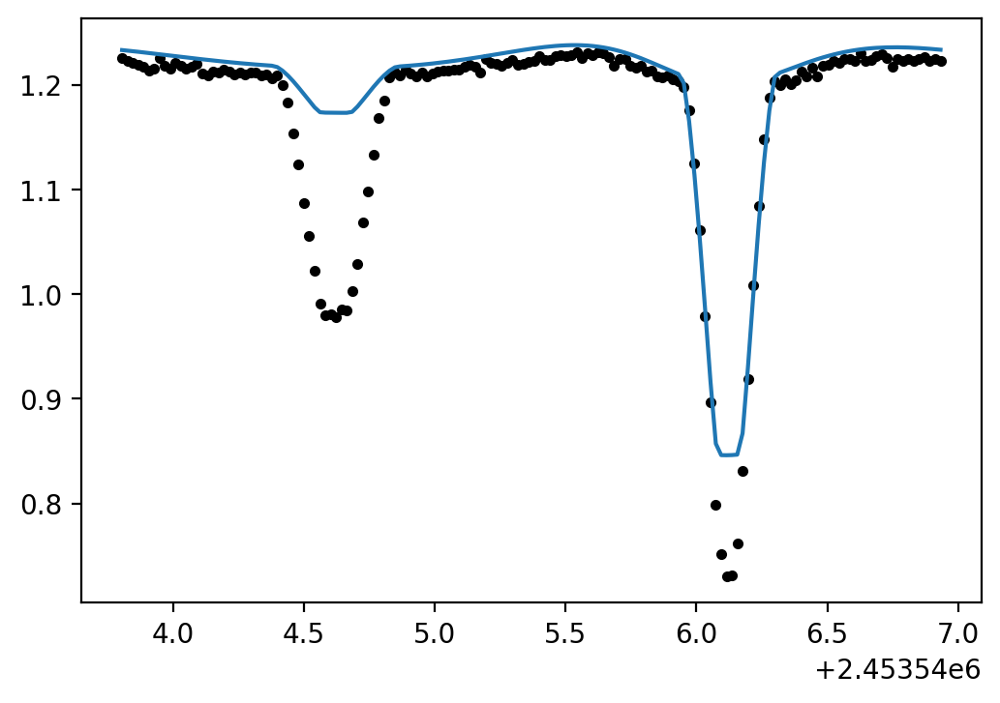

In [16]:
f_c, f_s = 0.0899, 0.365, 

u11, u12, u21, u22 = 0.1983, 0.2884, 0.1983, 0.2884
params = [np.pi, 
          0.4, 0.6,
          89,0.12, t0_guess, f_c, f_s, 0.2
#           u11, u12, u21, u22
         ]
sbratio = 0.6


lc =model(params, t_transit)

plt.plot(t_transit,y_transit, '.k')
plt.plot(t_transit, lc)

In [17]:
from scipy.optimize import minimize

#plt.plot(full_transit_time, model(params, full_transit_time))
soln_loc = minimize(nll, params, args=(t_transit, y_transit, yerr_transit), 
#                 method='Nelder-Mead'#, tol=100
               )

In [ ]:
incl@orbit 89.0914 87.3
requivratio 0.6349 0.6394
requivsum 1.9445 2.0230099999999998
ecosw 0.0317 0.0339
esinw 0.1079 0.1379
teffratio 0.8756 0.8678

In [21]:
from scipy.optimize import differential_evolution
#     period, rsum, rratio, incl, sbratio, t0, f_c, f_s, mean = params
pbounds = [(1,6),(0.1,0.9),(0.1,0.9),(80,90),(0.01,0.99),(t0_guess-1, t0_guess+1), (f_c-0.01, f_c+0.01), (f_s-0.01, f_s+0.01), (-1,1)]
soln = differential_evolution(nll, pbounds, args=(t_transit, y_transit, yerr_transit))

/Users/danielhey/anaconda3/envs/phoebe/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: overflow encountered in square


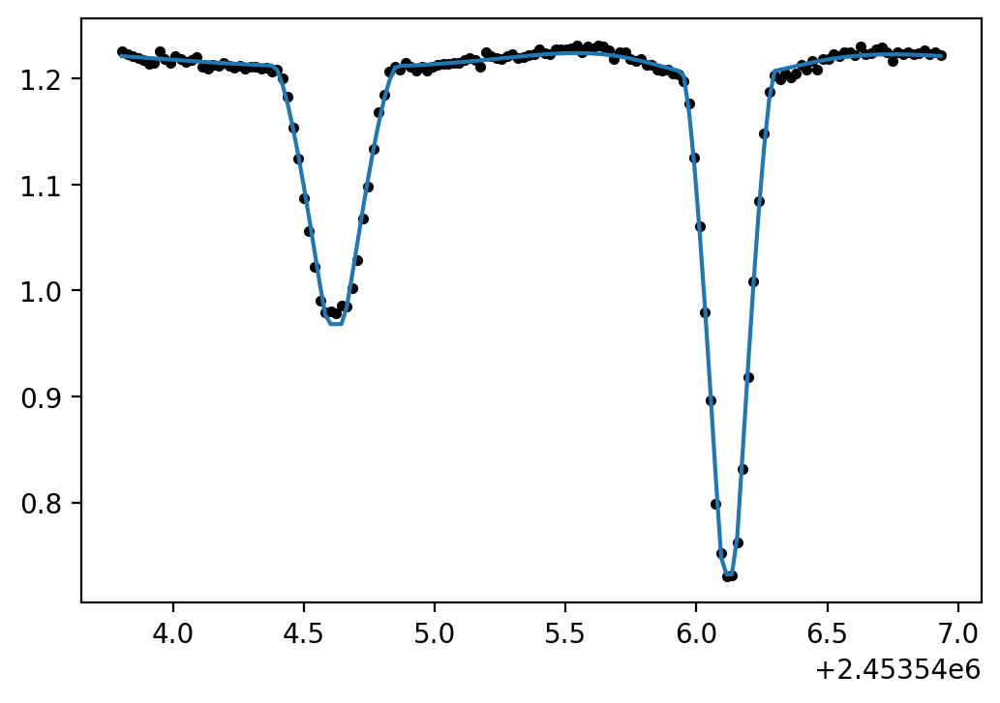

In [22]:
flux = model(soln['x'], t_transit)
plt.plot(t_transit,y_transit, '.k')
plt.plot(t_transit, flux)
# plt.xlim(t0_guess-1, t0_guess+1)

In [23]:
import emcee

pos = soln.x + 1e-4*np.random.randn(32, len(soln.x))
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnlike, args=(t_transit, y_transit, yerr_transit))
sampler.run_mcmc(pos, 10000, progress=True);

/Users/danielhey/anaconda3/envs/phoebe/lib/python3.7/site-packages/emcee/ensemble.py:258: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  category=RuntimeWarning,
100%|██████████| 10000/10000 [54:20<00:00,  3.07it/s]    


In [24]:
discard = 5000
flat_samples = sampler.get_chain(discard=discard,)

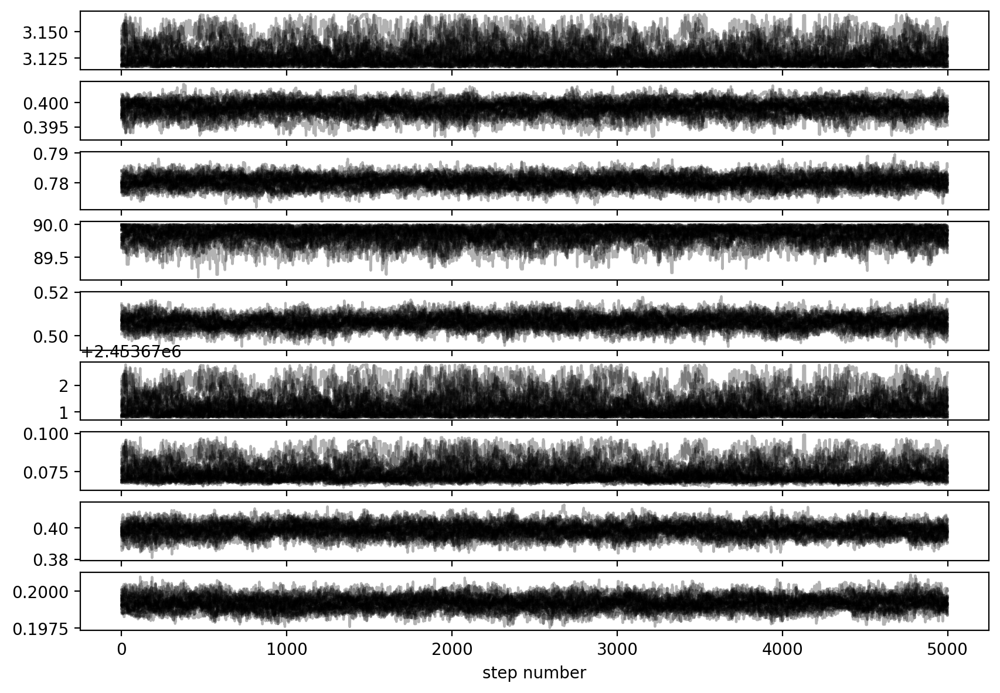

In [25]:
fig, axes = plt.subplots(len(flat_samples.T), figsize=(10, 7), sharex=True)
# samples = sampler.get_chain()
for i in range(ndim):
    ax = axes[i]
    ax.plot(flat_samples[:, :, i], "k", alpha=0.3)
#     ax.set_xlim(0, len(samples))
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

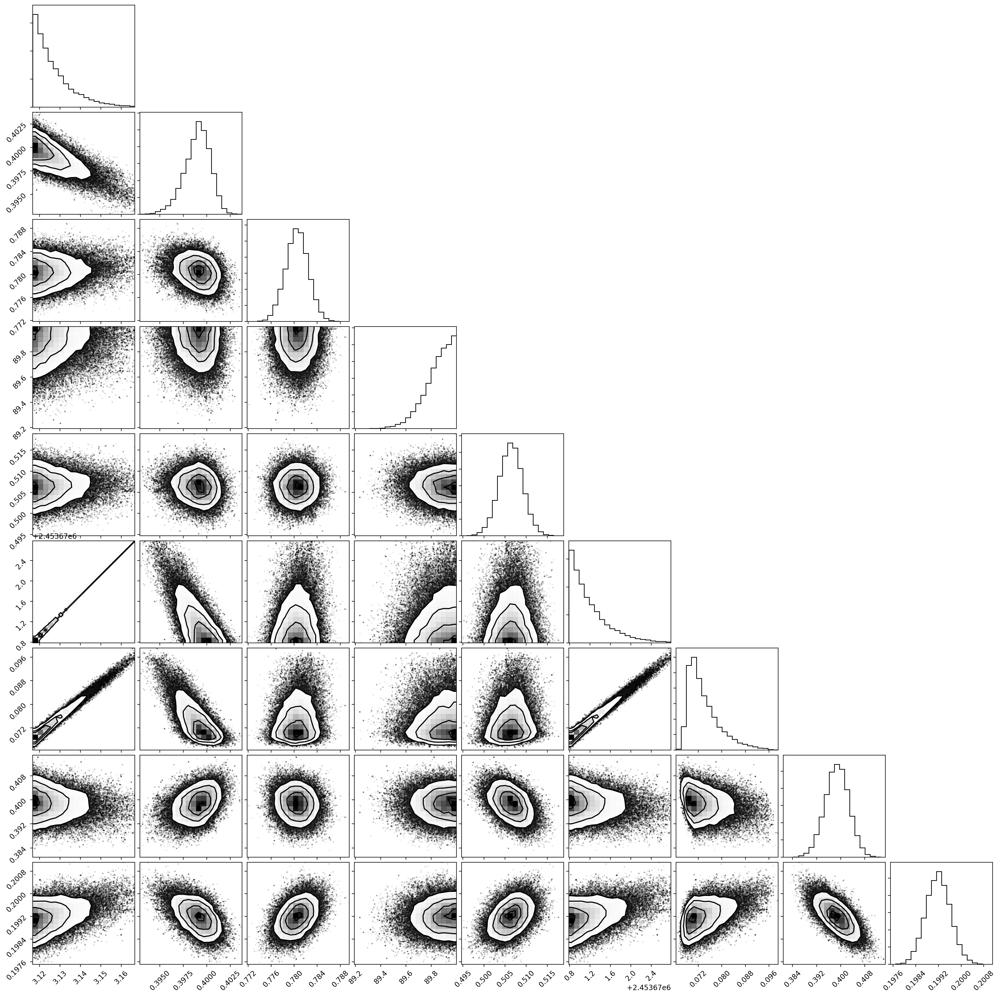

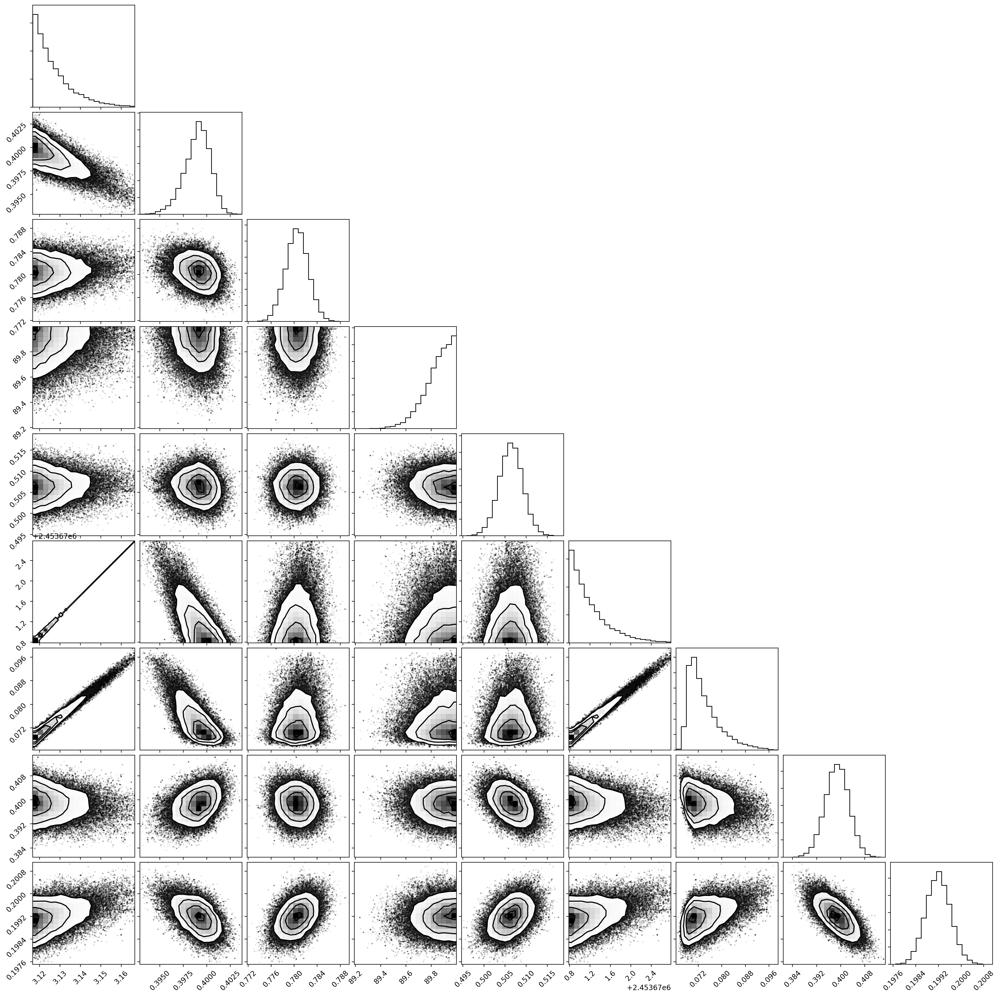

In [27]:
import corner
flat_samples = sampler.get_chain(discard=discard,flat=True)
corner.corner(flat_samples)